In [1]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import keras
from keras import layers
from keras import models
from keras import optimizers

from keras.utils import plot_model
from keras import backend
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils.np_utils import to_categorical  

PATH = "C:\\Users\\zackw\\Desktop\\353\\enph353_cnn_lab\\trainimg\\"
img_files = os.listdir(PATH)
Labels = [F[0] for F in img_files]
enc = LabelEncoder()
Classes = enc.fit_transform(Labels)
#Classes = to_categorical(Classes, num_classes = 36)
Frames = [np.array(cv.imread(PATH + F)) for F in img_files]
#Frames = [np.delete(x, range(100,110), 1) for x in Frames]
Frames = [cv.resize(x, (128,128)) for x in Frames]
Frames = np.stack(Frames).astype(float)/255
#Frames = Frames.reshape(Frames.shape[1]*Frames.shape[2]*Frames.shape[3], Frames.shape[0]).T

xtrain, xtest, ytrain, ytest = train_test_split(Frames, Classes, test_size = 0.1)


Using TensorFlow backend.


In [2]:
# model = models.Sequential()
# model.add(layers.Conv2D(64, (3, 3), input_shape = (128,128,3), activation='relu',))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Flatten())
# model.add(layers.Dropout(0.5))
# model.add(layers.Dense(512, activation='relu'))
# model.add(layers.Dense(128, activation = 'relu'))
# model.add(layers.Dense(36, activation='softmax'))

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(xtrain[0].shape)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(36, activation='softmax'))

adam = optimizers.adam(lr= 1e-5)

#train the model
model.compile(optimizer=adam,
             loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])

model.fit(xtrain, ytrain,
         epochs=10,
         verbose=1)






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/10
4024/4024 [==============================] - 60s 15ms/step - loss: 3.5121 - acc: 0.0842
Epoch 2/10
4024/4024 [==============================] - 57s 14ms/step - loss: 3.2361 - acc: 0.2662
Epoch 3/10
4024/4024 [==============================] - 62s 15ms/step - loss: 2.3233 - acc: 0.5099
Epoch 4/10
4024/4024 [==============================] - 62s 15ms/step - loss: 0.9112 - acc: 0.8181
Epoch 5/10
4024/4024 [==============================] - 61s 15ms/step - loss: 0.2747 - acc: 0.9575
Epoch 6/10
4024/4024 [==============================] - 58s 14ms/step - loss: 0.1193 - acc: 0.9856
Epoch 7/10
4024/4024 [==============================] - 58s 14ms/step - loss: 0.0706 - acc: 0.9920
Epoch 8/10
4024/4024 [==============================] - 58s 14ms/step - loss: 0.0439 - acc:

In [3]:
pred = model.predict(xtest)
pred = enc.inverse_transform([np.argmax(x) for x in pred])

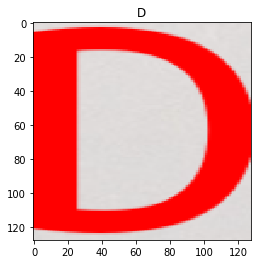

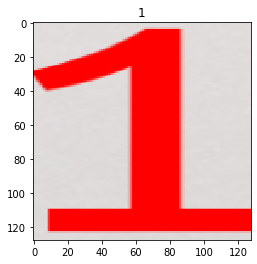

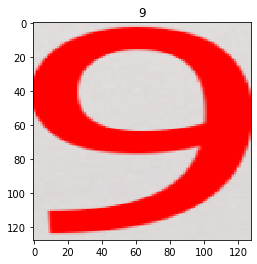

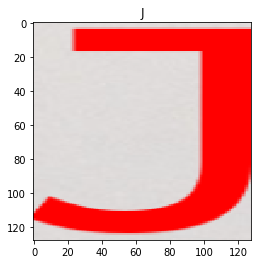

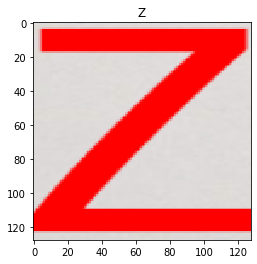

...

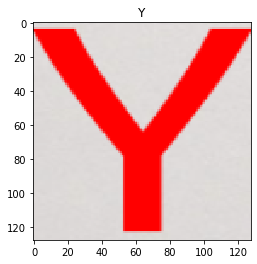

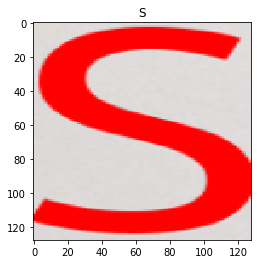

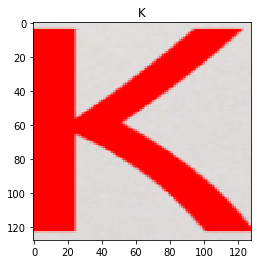

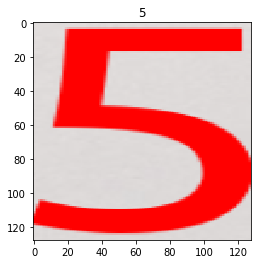

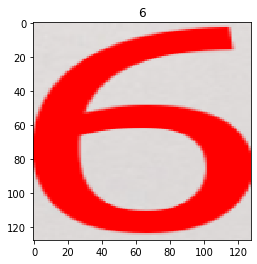

In [4]:
testlabels = enc.inverse_transform(ytest)
i = 0
for fr in xtest:
    plt.imshow(fr)
    title = pred[i]
    plt.title(title)
    plt.show() #enc.inverse_transform([pred[i]])+ " " + enc.inverse_transform([ytest[i]]))
    i += 1

In [22]:
import joblib
joblib.dump(model, "cnn2.jb")
#joblib.dump(enc, "encoder.jb")


['cnn2.jb']

In [16]:
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)
clf.fit(model.predict(xtrain), ytrain)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [17]:
out = clf.predict(model.predict(xtest))

ValueError: Found array with dim 4. Estimator expected <= 2.

In [21]:
right = (out == ytest)
print(right)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T